<a href="https://colab.research.google.com/github/kcat28/notebooks-/blob/main/Copy_of_Cancer_Dataset_FProject_ADML.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
import kagglehub
import pandas as pd
import os

from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
import matplotlib.pyplot as plt

In [ ]:
# Download the dataset
path = kagglehub.dataset_download("ankushpanday1/cancer-datasettop-50-populated-countries")
print("Path to dataset files:", path)

# Inspect the downloaded directory
print("Files in the directory:")
print(os.listdir(path))

# Update the path to point to the correct location of the data.
#Get the file name:
file_name = os.listdir(path)[0]
data_path = os.path.join(path, file_name)

#display all columns
pd.set_option('display.max_columns', None)
# Make the dataframe:
df = pd.read_csv(data_path, sep=",")  # Read in the data from the correct path.


print("First 5 records:")
df.head()

Path to dataset files: /root/.cache/kagglehub/datasets/ankushpanday1/cancer-datasettop-50-populated-countries/versions/1
Files in the directory:
['global_cancer_predictions.csv']
First 5 records:


,Country,Age_Group,Cancer_Type,Risk_Factors,Incidence,Mortality,Prevalence,Urban_Population,Health_Expenditure_%GDP,Tobacco_Use_%,Alcohol_Consumption_Liters,Physical_Activity_%,Obesity_%,Air_Quality_Index,UV_Radiation,Family_History_%,Genetic_Mutation_%,Treatment_Coverage_%,GDP_per_Capita,Life_Expectancy,Health_Infrastructure_Index,Education_Index,Population_Density
0,Turkey,15-24,Lung,Obesity,44,457,955,32.906758,11.834005,12.578421,1.445909,33.197197,33.944196,96,2.877395,44.300862,6.924822,97.210912,29779,82.366306,2.324139,0.875452,736.609006
1,Canada,0-14,Prostate,Genetic,643,278,150,40.207750,6.412955,25.120870,4.903533,41.992279,14.641975,69,9.851073,17.727832,7.480867,98.658890,27570,56.791854,2.875398,0.730587,827.101915
2,China,15-24,Breast,Pollution,565,161,1428,62.225708,7.066045,33.662102,5.707092,56.051626,29.286155,10,3.156956,45.250388,17.109909,80.144866,50479,62.069261,1.502259,0.757807,139.180394
3,India,15-24,Leukemia,Inactivity,509,117,1996,84.119599,12.102488,29.599358,9.894173,53.946642,33.498229,179,6.364374,18.079635,5.280028,84.765434,67829,60.673865,8.945143,0.805388,776.916329
4,Nigeria,15-24,Prostate,Pollution,288,170,383,37.403640,14.487316,15.348235,4.309904,52.548490,31.037963,151,9.038135,20.292538,7.763366,81.781825,77986,66.400764,7.332599,0.748743,494.974242


In [ ]:
df.sample(5)

,Country,Age_Group,Cancer_Type,Risk_Factors,Incidence,Mortality,Prevalence,Urban_Population,Health_Expenditure_%GDP,Tobacco_Use_%,Alcohol_Consumption_Liters,Physical_Activity_%,Obesity_%,Air_Quality_Index,UV_Radiation,Family_History_%,Genetic_Mutation_%,Treatment_Coverage_%,GDP_per_Capita,Life_Expectancy,Health_Infrastructure_Index,Education_Index,Population_Density
84398,Malaysia,65+,Prostate,Alcohol,353,375,1972,68.034095,3.583587,37.425256,11.273684,73.914183,30.952924,6,7.312698,44.387337,15.554458,56.606357,66170,66.139159,3.823007,0.711997,522.360965
70789,China,55-64,Breast,Tobacco,713,377,619,86.744499,7.466600,32.082868,5.804338,33.735198,25.726778,103,7.830133,49.532621,12.207581,71.532853,1479,57.935546,1.640896,0.838068,726.620991
99140,France,0-14,Lymphoma,Alcohol,819,143,1828,54.953966,10.768271,29.051621,14.731148,43.811814,12.889205,13,9.079396,17.516200,8.984767,92.323744,44034,66.397422,8.205357,0.817045,376.657414
25039,Nigeria,15-24,Prostate,Diet,823,92,1163,50.023156,6.487084,34.675920,1.439750,57.026875,17.503122,127,8.150805,15.235795,7.704721,68.265741,50308,51.467760,5.014556,0.828471,371.092636
77586,Ethiopia,15-24,Skin,Inactivity,887,305,1921,38.891357,3.397356,39.149184,4.452499,44.221151,32.508160,139,5.523781,12.206520,18.730135,83.885091,10536,56.158064,6.525982,0.686028,351.208052


In [ ]:
df.duplicated().sum()

0

In [ ]:
df['Age_Group'].value_counts()

,count
Age_Group,
65+,32171
55-64,32089
15-24,32077
25-54,31909
0-14,31754


In [ ]:
df['Cancer_Type'].value_counts()

,count
Cancer_Type,
Neuroblastoma,16178
Breast,16113
Colorectal,16090
Leukemia,16077
Lung,16052
Prostate,16009
Brain,15892
Lymphoma,15890
Skin,15881


In [ ]:
df['Risk_Factors'].value_counts()

,count
Risk_Factors,
Genetic,20228
Tobacco,20210
Obesity,20067
Radiation,19974
Pollution,19957
Alcohol,19931
Inactivity,19822
Diet,19811


In [ ]:
df.dropna(inplace=True)
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 160000 entries, 0 to 159999
Data columns (total 23 columns):
 #   Column                       Non-Null Count   Dtype  
---  ------                       --------------   -----  
 0   Country                      160000 non-null  object 
 1   Age_Group                    160000 non-null  object 
 2   Cancer_Type                  160000 non-null  object 
 3   Risk_Factors                 160000 non-null  object 
 4   Incidence                    160000 non-null  int64  
 5   Mortality                    160000 non-null  int64  
 6   Prevalence                   160000 non-null  int64  
 7   Urban_Population             160000 non-null  float64
 8   Health_Expenditure_%GDP      160000 non-null  float64
 9   Tobacco_Use_%                160000 non-null  float64
 10  Alcohol_Consumption_Liters   160000 non-null  float64
 11  Physical_Activity_%          160000 non-null  float64
 12  Obesity_%                    160000 non-null  float64
 13 

In [ ]:
df.sample(3)

,Country,Age_Group,Cancer_Type,Risk_Factors,Incidence,Mortality,Prevalence,Urban_Population,Health_Expenditure_%GDP,Tobacco_Use_%,Alcohol_Consumption_Liters,Physical_Activity_%,Obesity_%,Air_Quality_Index,UV_Radiation,Family_History_%,Genetic_Mutation_%,Treatment_Coverage_%,GDP_per_Capita,Life_Expectancy,Health_Infrastructure_Index,Education_Index,Population_Density
111753,Nepal,25-54,Lymphoma,Inactivity,268,252,1437,60.294369,5.901296,38.535680,10.405980,51.572054,25.249970,38,2.554744,46.171148,19.168912,79.446592,4162,55.157016,9.619852,0.444760,732.540458
131534,Spain,65+,Brain,Radiation,861,431,1079,66.227872,11.267016,18.087390,5.222871,23.844445,36.145356,97,6.532748,15.262177,8.387623,65.530516,11694,54.361541,3.472113,0.720235,173.576338
74882,Madagascar,25-54,Skin,Tobacco,716,8,1931,78.078768,4.552653,33.014083,6.261668,39.857263,29.352413,197,5.167838,43.794256,15.123405,79.134233,41283,67.668926,6.897674,0.877878,723.922050


In [ ]:
df['Country'].value_counts()

,count
Country,
Venezuela,3261
Madagascar,3251
Argentina,3239
Afghanistan,3233
Ukraine,3224
Japan,3220
Pakistan,3215
Russia,3215
Ghana,3207


In [ ]:
# country_to_region = {
#     'Venezuela': 'South America',
#     'Madagascar': 'Africa',
#     'Argentina': 'South America',
#     'Afghanistan': 'Asia',
#     'Ukraine': 'Europe',
#     'Japan': 'Asia',
#     'Pakistan': 'Asia',
#     'Russia': 'Europe',
#     'Ghana': 'Africa',
#     'Malaysia': 'Asia',
#     'Canada': 'North America',
#     'Brazil': 'South America',
#     'Iran': 'Asia',
#     'Peru': 'South America',
#     'Uzbekistan': 'Asia',
#     'Bangladesh': 'Asia',
#     'Egypt': 'Africa',
#     'Sudan': 'Africa',
#     'Spain': 'Europe',
#     'Australia': 'Oceania',
#     'United Kingdom': 'Europe',
#     'Colombia': 'South America',
#     'Nepal': 'Asia',
#     'Germany': 'Europe',
#     'South Africa': 'Africa',
#     'Philippines': 'Asia',
#     'Turkey': 'Europe',
#     'Indonesia': 'Asia',
#     'Iraq': 'Asia',
#     'DR Congo': 'Africa',
#     'Ethiopia': 'Africa',
#     'Morocco': 'Africa',
#     'France': 'Europe',
#     'Italy': 'Europe',
#     'India': 'Asia',
#     'Yemen': 'Asia',
#     'Mozambique': 'Africa',
#     'Angola': 'Africa',
#     'Thailand': 'Asia',
#     'Cameroon': 'Africa',
#     'Nigeria': 'Africa',
#     'United States': 'North America',
#     'Poland': 'Europe',
#     'Uganda': 'Africa',
#     'South Korea': 'Asia',
#     'Vietnam': 'Asia',
#     'Niger': 'Africa',
#     'Mexico': 'North America',
#     'Sri Lanka': 'Asia',
#     'Saudi Arabia': 'Asia',
#     'China': 'Asia'
# }

# df['Region'] = df['Country'].map(country_to_region)

# df.sample(3)

In [ ]:
# df['Region'].value_counts()

- 0: Africa
- 1: Asia
- 2: Europe
- 3: North America
- 4: Oceana
- 5: South America



In [ ]:
# df.drop(['Country'], axis=1, inplace=True)
# df.sample(2)

In [ ]:
from sklearn.preprocessing import LabelEncoder

# country_encoder = LabelEncoder()
# df['Country'] = country_encoder.fit_transform(df['Country'])

risk_encoder = LabelEncoder()
df['Risk_Factors_Encoded'] = risk_encoder.fit_transform(df['Risk_Factors'])

cancer_encoder = LabelEncoder()
df['Cancer_Type_Encoded'] = cancer_encoder.fit_transform(df['Cancer_Type'])


risk_mapping = dict(zip(risk_encoder.classes_, risk_encoder.transform(risk_encoder.classes_)))
cancer_mapping = dict(zip(cancer_encoder.classes_, cancer_encoder.transform(cancer_encoder.classes_)))

print("Risk Factors Mapping:", risk_mapping)
print("Cancer Type Mapping:", cancer_mapping)
df.drop(['Risk_Factors', 'Cancer_Type'], axis=1, inplace=True)
df.sample(1)

Risk Factors Mapping: {'Alcohol': 0, 'Diet': 1, 'Genetic': 2, 'Inactivity': 3, 'Obesity': 4, 'Pollution': 5, 'Radiation': 6, 'Tobacco': 7}
Cancer Type Mapping: {'Brain': 0, 'Breast': 1, 'Colorectal': 2, 'Leukemia': 3, 'Lung': 4, 'Lymphoma': 5, 'Neuroblastoma': 6, 'Prostate': 7, 'Skin': 8, 'Wilms': 9}


,Country,Age_Group,Incidence,Mortality,Prevalence,Urban_Population,Health_Expenditure_%GDP,Tobacco_Use_%,Alcohol_Consumption_Liters,Physical_Activity_%,Obesity_%,Air_Quality_Index,UV_Radiation,Family_History_%,Genetic_Mutation_%,Treatment_Coverage_%,GDP_per_Capita,Life_Expectancy,Health_Infrastructure_Index,Education_Index,Population_Density,Risk_Factors_Encoded,Cancer_Type_Encoded
118930,United States,15-24,460,387,857,41.71625,4.948322,15.136043,14.55444,79.122518,24.959101,52,4.197578,38.986831,15.906219,67.954381,41634,70.777625,6.700725,0.804266,206.889034,7,2


In [ ]:
from sklearn.preprocessing import StandardScaler, MinMaxScaler

scaler =StandardScaler()
numerical_features = ['Incidence', 'Mortality', 'Prevalence', 'Urban_Population',
                'Health_Expenditure_%GDP', 'Tobacco_Use_%', 'Alcohol_Consumption_Liters',
                'Physical_Activity_%', 'Obesity_%', 'Air_Quality_Index', 'UV_Radiation',
                'Family_History_%', 'Genetic_Mutation_%', 'Treatment_Coverage_%',
                'GDP_per_Capita', 'Life_Expectancy', 'Health_Infrastructure_Index',
                'Education_Index', 'Population_Density']

from sklearn.preprocessing import OrdinalEncoder
age_group_encoder = OrdinalEncoder(categories=[['0-14', '15-24', '25-54', '55-64', '65+']])
df['Age_Group_Encoded'] = age_group_encoder.fit_transform(df[['Age_Group']])
df.drop(['Age_Group'], axis=1, inplace=True)

df[numerical_features] = scaler.fit_transform(df[numerical_features])
df.head()

,Country,Incidence,Mortality,Prevalence,Urban_Population,Health_Expenditure_%GDP,Tobacco_Use_%,Alcohol_Consumption_Liters,Physical_Activity_%,Obesity_%,Air_Quality_Index,UV_Radiation,Family_History_%,Genetic_Mutation_%,Treatment_Coverage_%,GDP_per_Capita,Life_Expectancy,Health_Infrastructure_Index,Education_Index,Population_Density,Risk_Factors_Encoded,Cancer_Type_Encoded,Age_Group_Encoded
0,Turkey,-1.579383,1.437910,-0.173034,-1.564441,0.819671,-1.439811,-1.624934,-0.970280,1.036109,-0.061055,-1.353182,1.243724,-1.284148,1.537698,-0.471274,1.472470,-1.222961,1.557415,0.806878,4,4,1.0
1,Canada,0.496783,0.198575,-1.641234,-1.142767,-0.747042,0.009173,-0.769415,-0.463288,-1.198818,-0.528734,1.667342,-1.061453,-1.155788,1.638049,-0.568039,-1.055252,-1.010556,0.553830,1.122904,2,7,0.0
2,China,0.226430,-0.611492,0.689647,0.128894,-0.558295,0.995910,-0.570591,0.347163,0.496773,-1.550700,-1.232095,1.326095,1.067038,0.354952,0.435489,-0.533645,-1.539637,0.742406,-1.279509,5,1,1.0
3,India,0.032332,-0.916133,1.725594,1.393390,0.897264,0.526556,0.465417,0.225821,0.984472,1.376626,0.157141,-1.030934,-1.663843,0.675176,1.195505,-0.671563,1.328163,1.072031,0.947642,3,3,1.0
4,Nigeria,-0.733666,-0.549179,-1.216277,-1.304720,1.586492,-1.119824,-0.916297,0.145225,0.699608,0.891625,1.315233,-0.838968,-1.090574,0.468400,1.640432,-0.105529,0.706838,0.679608,-0.036978,5,7,1.0


In [ ]:
from sklearn.preprocessing import LabelEncoder

# Create a LabelEncoder object
country_encoder = LabelEncoder()

# Fit the encoder to your 'Country' column and transform it
df['Country_Encoded'] = country_encoder.fit_transform(df['Country'])

# Print the mapping between original values and encoded values
country_mapping = dict(zip(country_encoder.classes_, country_encoder.transform(country_encoder.classes_)))
print("Country Mapping:", country_mapping)

df.drop(['Country'], axis=1, inplace=True)
df.sample(1)

Country Mapping: {'Afghanistan': 0, 'Angola': 1, 'Argentina': 2, 'Australia': 3, 'Bangladesh': 4, 'Brazil': 5, 'Cameroon': 6, 'Canada': 7, 'China': 8, 'Colombia': 9, 'DR Congo': 10, 'Egypt': 11, 'Ethiopia': 12, 'France': 13, 'Germany': 14, 'Ghana': 15, 'India': 16, 'Indonesia': 17, 'Iran': 18, 'Iraq': 19, 'Italy': 20, 'Japan': 21, 'Madagascar': 22, 'Malaysia': 23, 'Mexico': 24, 'Morocco': 25, 'Mozambique': 26, 'Nepal': 27, 'Niger': 28, 'Nigeria': 29, 'Pakistan': 30, 'Peru': 31, 'Philippines': 32, 'Poland': 33, 'Russia': 34, 'Saudi Arabia': 35, 'South Africa': 36, 'South Korea': 37, 'Spain': 38, 'Sri Lanka': 39, 'Sudan': 40, 'Thailand': 41, 'Turkey': 42, 'Uganda': 43, 'Ukraine': 44, 'United Kingdom': 45, 'United States': 46, 'Uzbekistan': 47, 'Venezuela': 48, 'Vietnam': 49, 'Yemen': 50}


,Incidence,Mortality,Prevalence,Urban_Population,Health_Expenditure_%GDP,Tobacco_Use_%,Alcohol_Consumption_Liters,Physical_Activity_%,Obesity_%,Air_Quality_Index,UV_Radiation,Family_History_%,Genetic_Mutation_%,Treatment_Coverage_%,GDP_per_Capita,Life_Expectancy,Health_Infrastructure_Index,Education_Index,Population_Density,Risk_Factors_Encoded,Cancer_Type_Encoded,Age_Group_Encoded,Country_Encoded
62545,0.770601,0.039331,-1.333003,-1.361439,-0.7054,-0.70322,0.501684,-0.182137,0.825484,1.671091,-1.104932,0.359695,1.330965,-1.303685,0.127365,0.996347,-0.954194,-0.567599,1.221439,0,5,1.0,8


In [ ]:
pca = PCA(n_components=3)
all_features = df.columns.tolist()
X = df[all_features]

principalComponents = pca.fit_transform(X)
principalDf = pd.DataFrame(data=principalComponents,
                           columns=['principal component 1', 'principal component 2', 'principal component 3'])

In [ ]:
import pandas as pd
from sklearn.decomposition import PCA

# Explained variance ratio
explained_variance_ratio = pca.explained_variance_ratio_
print("Explained Variance Ratio:", explained_variance_ratio)

# Cumulative explained variance
cumulative_explained_variance = explained_variance_ratio.cumsum()
print("Cumulative Explained Variance:", cumulative_explained_variance)

Explained Variance Ratio: [0.86295066 0.03267958 0.02089064]
Cumulative Explained Variance: [0.86295066 0.89563024 0.91652088]


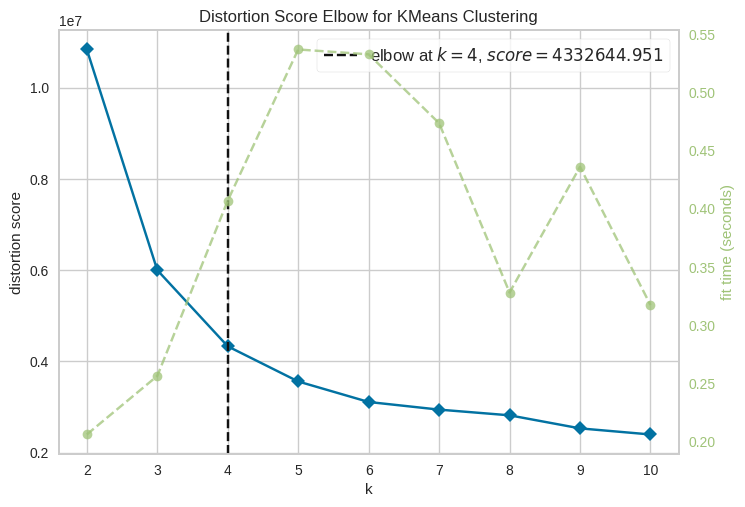

<Axes: title={'center': 'Distortion Score Elbow for KMeans Clustering'}, xlabel='k', ylabel='distortion score'>

In [ ]:
from sklearn.cluster import KMeans
from yellowbrick.cluster import KElbowVisualizer

Elbow_M = KElbowVisualizer(KMeans(), k=10)
Elbow_M.fit(principalDf)  # Changed PCA_ds to principalDf
Elbow_M.show()

In [ ]:
# import scipy.cluster.hierarchy as sch
# import matplotlib.pyplot as plt

# plt.figure(figsize=(8, 5))
# sch.dendrogram(sch.linkage(principalDf, method='ward'))
# plt.title("Hierarchical Clustering Dendrogram")
# plt.xlabel("Data Points")
# plt.ylabel("Distance")
# plt.show()

In [ ]:
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score

# Clustering with KMeans
kmeans = KMeans(n_clusters=4, random_state=42, n_init='auto')
kmeans_labels = kmeans.fit_predict(principalDf)
silhouette_kmeans = silhouette_score(principalDf, kmeans_labels)
print(f"The average silhouette_score of KMeans is : {silhouette_kmeans}")

The average silhouette_score of KMeans is : 0.41825647152543505


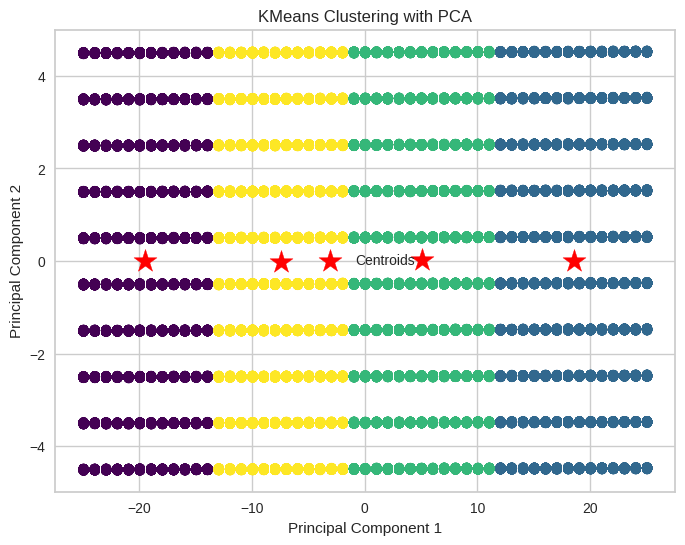

In [ ]:
# Get the cluster labels from your KMeans model
kmeans_labels = kmeans.labels_

# Create a scatter plot
plt.figure(figsize=(8, 6))
plt.scatter(principalDf['principal component 1'], principalDf['principal component 2'], c=kmeans_labels, cmap='viridis')
plt.scatter(kmeans.cluster_centers_[:, 0], kmeans.cluster_centers_[:, 1], s=300, c='red', marker='*', label='Centroids')
plt.title('KMeans Clustering with PCA')
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.legend()
plt.show()

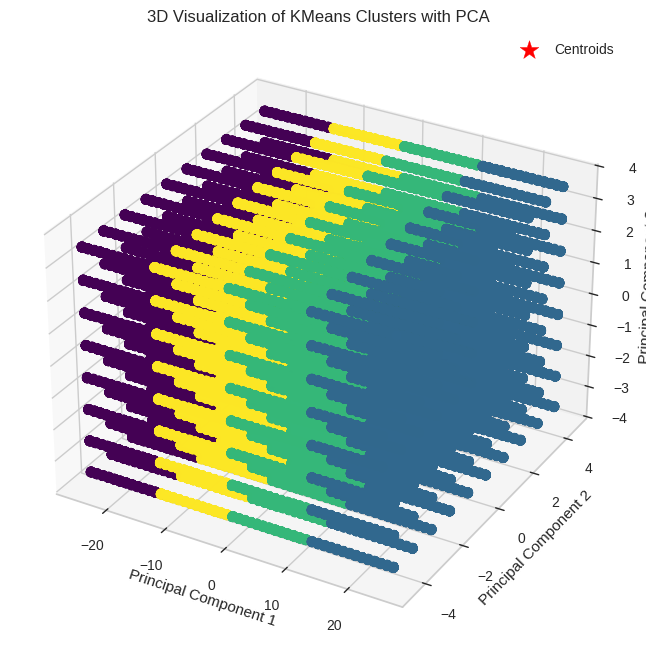

In [ ]:
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D

# Create a figure and a 3D subplot
fig = plt.figure(figsize=(10, 8))  # Adjust figure size if needed
ax = fig.add_subplot(111, projection='3d')

# Scatter plot of data points colored by cluster
ax.scatter(principalDf['principal component 1'],
           principalDf['principal component 2'],
           principalDf['principal component 3'],
           c=kmeans_labels, cmap='viridis', s=50)  # s=50 adjusts marker size

# Plot cluster centers
ax.scatter(kmeans.cluster_centers_[:, 0],
           kmeans.cluster_centers_[:, 1],
           kmeans.cluster_centers_[:, 2],
           s=200, c='red', marker='*', label='Centroids')

# Set labels and title
ax.set_xlabel('Principal Component 1')
ax.set_ylabel('Principal Component 2')
ax.set_zlabel('Principal Component 3')
ax.set_title('3D Visualization of KMeans Clusters with PCA')
ax.legend()

# Display the plot
plt.show()

In [ ]:
import plotly.express as px

# Assuming 'principalDf' is your DataFrame with PCA components and 'kmeans_labels' are your cluster labels

fig = px.scatter_3d(principalDf, x='principal component 1', y='principal component 2', z='principal component 3',
                    color=kmeans_labels, title="3D Cluster Plot with Plotly")
fig.show()

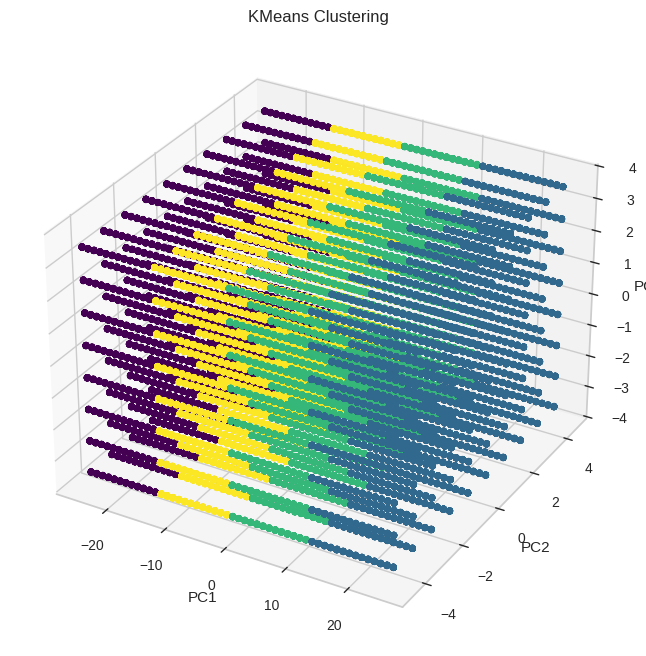

In [ ]:
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D

fig = plt.figure(figsize=(10, 8)) # Adjust figure size if needed
ax1 = fig.add_subplot(111, projection='3d')

# Scatter plot
ax1.scatter(principalDf['principal component 1'], principalDf['principal component 2'], principalDf['principal component 3'],
            c=kmeans_labels, cmap='viridis')

ax1.set_title('KMeans Clustering')
ax1.set_xlabel('PC1')
ax1.set_ylabel('PC2')
ax1.set_zlabel('PC3')

plt.show()

In [ ]:
df['KMeans_Cluster'] = kmeans_labels
df.head()

,Incidence,Mortality,Prevalence,Urban_Population,Health_Expenditure_%GDP,Tobacco_Use_%,Alcohol_Consumption_Liters,Physical_Activity_%,Obesity_%,Air_Quality_Index,UV_Radiation,Family_History_%,Genetic_Mutation_%,Treatment_Coverage_%,GDP_per_Capita,Life_Expectancy,Health_Infrastructure_Index,Education_Index,Population_Density,Risk_Factors_Encoded,Cancer_Type_Encoded,Age_Group_Encoded,Country_Encoded,KMeans_Cluster
0,-1.579383,1.437910,-0.173034,-1.564441,0.819671,-1.439811,-1.624934,-0.970280,1.036109,-0.061055,-1.353182,1.243724,-1.284148,1.537698,-0.471274,1.472470,-1.222961,1.557415,0.806878,4,4,1.0,42,1
1,0.496783,0.198575,-1.641234,-1.142767,-0.747042,0.009173,-0.769415,-0.463288,-1.198818,-0.528734,1.667342,-1.061453,-1.155788,1.638049,-0.568039,-1.055252,-1.010556,0.553830,1.122904,2,7,0.0,7,0
2,0.226430,-0.611492,0.689647,0.128894,-0.558295,0.995910,-0.570591,0.347163,0.496773,-1.550700,-1.232095,1.326095,1.067038,0.354952,0.435489,-0.533645,-1.539637,0.742406,-1.279509,5,1,1.0,8,0
3,0.032332,-0.916133,1.725594,1.393390,0.897264,0.526556,0.465417,0.225821,0.984472,1.376626,0.157141,-1.030934,-1.663843,0.675176,1.195505,-0.671563,1.328163,1.072031,0.947642,3,3,1.0,16,3
4,-0.733666,-0.549179,-1.216277,-1.304720,1.586492,-1.119824,-0.916297,0.145225,0.699608,0.891625,1.315233,-0.838968,-1.090574,0.468400,1.640432,-0.105529,0.706838,0.679608,-0.036978,5,7,1.0,29,2


<ipython-input-44-633740ff3059>:5: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




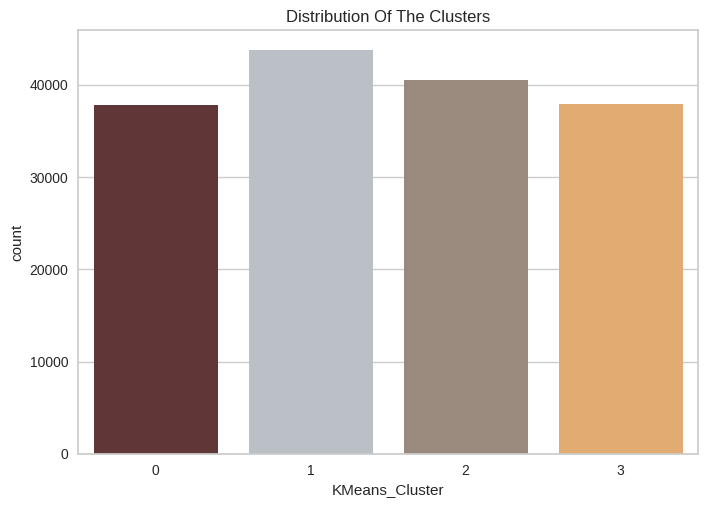

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt

pal = ["#682F2F","#B9C0C9", "#9F8A78","#F3AB60"]
pl2 = sns.countplot(x=df['KMeans_Cluster'], palette=pal)
pl2.set_title("Distribution Of The Clusters")
plt.show()

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np

feature1 = 'Country'

plt.figure(figsize=(15, 10))
sns.boxplot(x='KMeans_Cluster', y=feature1, data=df, palette="Set2")
plt.title(f"KMeans - {feature1} Distribution")

# Calculate and add median values
medians = df.groupby('KMeans_Cluster')[feature1].median().values
positions = range(len(medians))

for i, median in enumerate(medians):
    plt.text(positions[i], median + 0.02, f'{median:.2f}',
             horizontalalignment='center', size='medium', color='black', weight='semibold')

# Get min and max for Country to dynamically set y-axis ticks
country_min = df[feature1].min()
country_max = df[feature1].max()

# Generate y-ticks from min to max with desired step size (e.g., 1)
plt.yticks(np.arange(round(country_min, 0), round(country_max + 1, 0), 1))  # Step size of 1

# Add a horizontal grid (optional)
plt.grid(axis='y', linestyle='--', alpha=0.7)

plt.show()

ValueError: Could not interpret value `Country` for `y`. An entry with this name does not appear in `data`.

<Figure size 1500x1000 with 0 Axes>

In [ ]:
df['Cancer_Type_Encoded'].value_counts()

In [ ]:
# from sklearn.cluster import AgglomerativeClustering
# from sklearn.metrics import silhouette_score

# # Clustering with Agglomerative Clustering
# agg_clustering = AgglomerativeClustering(n_clusters=4)
# agg_labels = agg_clustering.fit_predict(principalDf)
# silhouette_agg = silhouette_score(principalDf, agg_labels)
# print(f"The average silhouette_score of Agglomerative Clustering is : {silhouette_agg}")

In [ ]:
# from sklearn.cluster import KMeans
# from yellowbrick.cluster import SilhouetteVisualizer
# from sklearn.metrics import silhouette_score

# kmeans = KMeans(n_clusters=4, random_state=42)
# visualizer = SilhouetteVisualizer(kmeans, colors='yellowbrick')
# visualizer.fit(principalDf)
# visualizer.show()